# Исследовательский анализ данных сервиса Яндекс Афиша

В этом проекте используется информация о покупках билетов и событиях на сервисе Яндекс Афиша. С его помощью пользователи могут узнавать информацию о мероприятиях в разных городах и покупать на них билеты. Сервис сотрудничает с партнёрами — организаторами мероприятий и билетными операторами, которые предоставляют информацию о событиях и выставляют билеты на продажу.

**Выполнила: Медведева Ольга**

**Дата: 28.08.2025**

<span style="font-size: 20px;">**Цель и задачи:**</span>

**Цель:** Подготовить датасет, провести исследовательский анализ данных летнего и осеннего периода, оценить активность в разные сезоны и проверить гипотезы о том, есть осенью ли влияние типа устройства на количество и частоту заказов.

**Задачи:**
1. Загрузить данные и познакомиться с их содержимым.
2. Провести предобработку данных.
3. Провести исследовательский анализ данных.
4. Проверить гипотезы.
4. Сформулировать выводы по проведённому анализу.


<span style="font-size: 20px;">**Данные:**</span>

Для анализа поступили данные сервиса Яндекс Афиша. Данные состоят из двух датасетов:

- `final_tickets_orders_df.csv` - включает информацию обо всех заказах билетов, совершённых с двух типов устройств — мобильных и стационарных;
- `final_tickets_events_df.csv` - содержит информацию о событиях, включая город и регион события, а также информацию о площадке проведения мероприятия;
- `final_tickets_tenge_df.csv` - содержит информацию о курсе тенге к российскому рублю за 2024 год.
    
<span style="font-size: 15px;">**Описание датасета `final_tickets_orders_df`**</span>

- `order_id` — уникальный идентификатор заказа.
- `user_id` — уникальный идентификатор пользователя.
- `created_dt_msk` — дата создания заказа (московское время).
- `created_ts_msk` — дата и время создания заказа (московское время).
- `event_id` — идентификатор мероприятия из таблицы events.
- `cinema_circuit` — сеть кинотеатров. Если не применимо, то здесь будет значение 'нет'.
- `age_limit` — возрастное ограничение мероприятия.
- `currency_code` — валюта оплаты, например rub для российских рублей.
- `device_type_canonical` — тип устройства, с которого был оформлен заказ, например mobile для мобильных устройств, desktop для стационарных;
- `revenue` — выручка от заказа.
- `service_name` — название билетного оператора.
- `tickets_count` — количество купленных билетов.
- `total` — общая сумма заказа.
- `days_since_prev` - количество дней с последнего заказа.

<span style="font-size: 15px;">**Описание датасета `final_tickets_events_df`**</span>

- `event_id` — уникальный идентификатор мероприятия.
- `event_name` — название мероприятия. Аналог поля event_name_code из исходной базы данных.
- `event_type_description` — описание типа мероприятия.
- `event_type_main` — основной тип мероприятия: театральная постановка, концерт и так далее.
- `organizers` — организаторы мероприятия.
- `region_name` — название региона.
- `city_name` — название города.
- `venue_id` — уникальный идентификатор площадки.
- `venue_name` — название площадки.
- `venue_address` — адрес площадки.

<span style="font-size: 15px;">**Описание датасета `final_tickets_tenge_df`**</span>

- `nominal` — номинал (100 тенге);
- `data` — дата;
- `curs` — курс тенге к рублю;
- `cdx` — обозначение валюты (kzt).

<span style="font-size: 20px;">**Структура проекта:**</span>

1. Знакомство с данными: загрузка и первичная предобработка
2. Исследовательский анализ данных
3. Статистический анализ данных
4. Общий вывод и рекомендации

---

## Загрузка данных и знакомство с ними

Начнём с загрузки библиотек и датасетов `final_tickets_orders_df`, `final_tickets_events_df` и `final_tickets_tenge_df`. Будем использовать pandas и библиотеки визуализации данных matplotlib и seaborn.

In [82]:
# Импортируем библиотеки
import pandas as pd
from math import fabs
from scipy.stats import ttest_ind
import statistics
import matplotlib.pyplot as plt
import plotly.express as px

In [83]:
orders_df = pd.read_csv('https://code.s3.yandex.net/datasets/final_tickets_orders_df.csv')
events_df = pd.read_csv('https://code.s3.yandex.net/datasets/final_tickets_events_df.csv')
tenge_df = pd.read_csv('https://code.s3.yandex.net/datasets/final_tickets_tenge_df.csv')

## Предобработка данных и подготовка их к исследованию

Рассмотрим все данные, проверим корректность типов, наличие пропусков и значений индикаторов.

In [84]:
display(orders_df.head())

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev
0,4359165,0002849b70a3ce2,2024-08-20,2024-08-20 16:08:03,169230,нет,16,rub,mobile,1521.94,Край билетов,4,10870.99,NaN
1,7965605,0005ca5e93f2cf4,2024-07-23,2024-07-23 18:36:24,237325,нет,0,rub,mobile,289.45,Мой билет,2,2067.51,NaN
2,7292370,0005ca5e93f2cf4,2024-10-06,2024-10-06 13:56:02,578454,нет,0,rub,mobile,1258.57,За билетом!,4,13984.16,75.0
3,1139875,000898990054619,2024-07-13,2024-07-13 19:40:48,387271,нет,0,rub,mobile,8.49,Лови билет!,2,212.28,NaN
4,972400,000898990054619,2024-10-04,2024-10-04 22:33:15,509453,нет,18,rub,mobile,1390.41,Билеты без проблем,3,10695.43,83.0


In [85]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290849 entries, 0 to 290848
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   order_id               290849 non-null  int64  
 1   user_id                290849 non-null  object 
 2   created_dt_msk         290849 non-null  object 
 3   created_ts_msk         290849 non-null  object 
 4   event_id               290849 non-null  int64  
 5   cinema_circuit         290849 non-null  object 
 6   age_limit              290849 non-null  int64  
 7   currency_code          290849 non-null  object 
 8   device_type_canonical  290849 non-null  object 
 9   revenue                290849 non-null  float64
 10  service_name           290849 non-null  object 
 11  tickets_count          290849 non-null  int64  
 12  total                  290849 non-null  float64
 13  days_since_prev        268909 non-null  float64
dtypes: float64(3), int64(4), object(7)
m

Датасет `orders_df` содержит 14 столбцов и 290849 строки, в которых представлена информация о заказах на сервисе Яндекс Афиша.

После первичного ознакомления с данными, можно сделать следующие выводы:
- Названия столбцов соответствуют snake_case;
- Некоторые данные, а именно столбцы `created_dt_msk` и `created_ts_msk` хранятся в типах данных `object`, для корректности стоит заменить этот тип данных на `datetime`, но, так как в будущем планируется соединение таблиц по столбцу `created_dt_msk` и у нас уже будет столбец с полной датой и временем, принято решение менять тип только у столбца `created_ts_msk`, а `created_dt_msk` оставить типом `object`. Также, можно уменшить размерность столбцов `age_limit` и `tickets_count`.
- Пропуски содержатся только в последнем столбце `days_since_prev`. Однако следует проверить столбцы с категориальными данными: в них могут встречаться значения-индикаторы, которые могут говорить об отсутствии данных.
- Судя по первому знакомству с данными, значения в столбцах соответствуют своему описанию.

Преобразуем типы данных, проверим на значения-индикаторы и исследуем выбросы в количественных данных:

In [86]:
# Преобразовываем типы данных в datetime
orders_df['created_ts_msk'] = pd.to_datetime(orders_df['created_ts_msk'])

In [87]:
orders_df['age_limit'] = pd.to_numeric(orders_df['age_limit'], downcast='integer')
orders_df['tickets_count'] = pd.to_numeric(orders_df['tickets_count'], downcast='integer')

In [88]:
# Проверяем уникальные значения в столбцах
for column in ['cinema_circuit', 'age_limit', 'currency_code', 'device_type_canonical', 'service_name']:
    print(f'Уникальные значения в столбце {column}:')
    print(orders_df[column].sort_values().unique())
    print()

Уникальные значения в столбце cinema_circuit:
['Другое' 'КиноСити' 'Киномакс' 'Москино' 'ЦентрФильм' 'нет']

Уникальные значения в столбце age_limit:
[ 0  6 12 16 18]

Уникальные значения в столбце currency_code:
['kzt' 'rub']

Уникальные значения в столбце device_type_canonical:
['desktop' 'mobile']

Уникальные значения в столбце service_name:
['Crazy ticket!' 'Show_ticket' 'Билет по телефону' 'Билеты без проблем'
 'Билеты в интернете' 'Билеты в руки' 'Быстробилет' 'Быстрый кассир'
 'Весь в билетах' 'Восьмёрка' 'Вперёд!' 'Выступления.ру'
 'Городской дом культуры' 'Дом культуры' 'Дырокол' 'За билетом!'
 'Зе Бест!' 'КарандашРУ' 'Кино билет' 'Край билетов' 'Лимоны'
 'Лови билет!' 'Лучшие билеты' 'Мир касс' 'Мой билет' 'Облачко'
 'Прачечная' 'Радио ticket' 'Реестр' 'Росбилет' 'Тебе билет!' 'Телебилет'
 'Тех билет' 'Цвет и билет' 'Шоу начинается!' 'Яблоко']



In [89]:
fig = px.box(orders_df, y='revenue', labels={'revenue': 'Выручка с заказа'})
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)

fig.show()

Удалим выбросы более 99 квантиля:

In [90]:
q99 = orders_df['revenue'].quantile(0.99)

orders_df = orders_df[orders_df['revenue'] < q99]

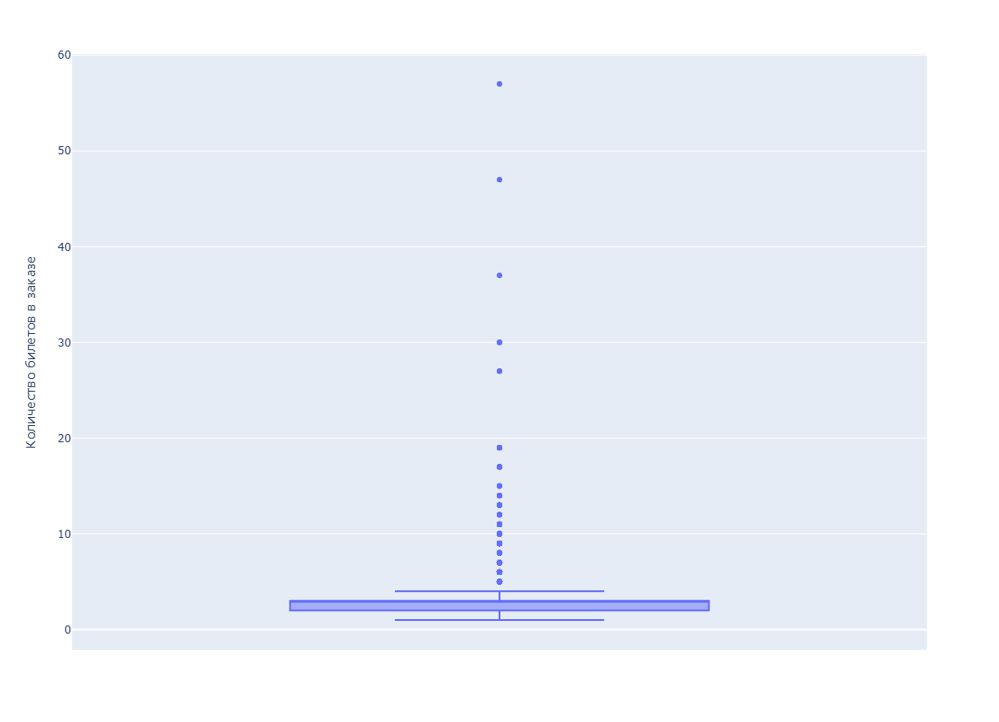

In [91]:
fig = px.box(orders_df, y='tickets_count', labels={'tickets_count': 'Количество билетов в заказе'})
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

Далее, проверим на наличие явных и неявных дубликатов.

In [92]:
# Удаления явных дубликатов
df_row_count = orders_df.shape[0]
orders_df = orders_df.drop_duplicates()
obvious_duplicate_count = df_row_count - orders_df.shape[0]

print(f'Было найдено и удалено {obvious_duplicate_count} явных дубликатов')

Было найдено и удалено 0 явных дубликатов


In [93]:
grouped_duplicates = orders_df.groupby(['user_id', 'created_ts_msk'])['order_id'].count().reset_index()
grouped_duplicates = grouped_duplicates[grouped_duplicates['order_id'] > 2]

display(orders_df[orders_df['user_id'].isin(grouped_duplicates['user_id'].to_list()) & 
        orders_df['created_ts_msk'].isin(grouped_duplicates['created_ts_msk'].to_list())].head(10))

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev
74521,4536210,35c4c43710a1e8c,2024-09-28,2024-09-28 13:43:54,568022,нет,12,rub,mobile,1891.93,Мир касс,6,18919.32,33.0
74525,4536239,35c4c43710a1e8c,2024-09-28,2024-09-28 13:43:54,568022,нет,12,rub,mobile,1576.61,Мир касс,5,15766.10,0.0
74528,4536123,35c4c43710a1e8c,2024-09-28,2024-09-28 13:43:54,568022,нет,12,rub,mobile,1891.93,Мир касс,6,18919.32,0.0
84010,3363711,3ee7dc2e115847f,2024-06-25,2024-06-25 07:32:08,277504,нет,6,rub,mobile,59.19,Билеты в руки,3,739.85,0.0
84015,3363798,3ee7dc2e115847f,2024-06-25,2024-06-25 07:32:08,277504,нет,6,rub,mobile,59.19,Билеты в руки,3,739.85,0.0
84017,3363827,3ee7dc2e115847f,2024-06-25,2024-06-25 07:32:08,277504,нет,6,rub,mobile,39.46,Билеты в руки,2,493.24,0.0
154170,5372628,7eb4fc207ecc10f,2024-08-23,2024-08-23 14:08:19,298035,нет,6,rub,mobile,126.84,Билеты без проблем,1,3170.95,0.0
154173,5372831,7eb4fc207ecc10f,2024-08-23,2024-08-23 14:08:19,298035,нет,6,rub,mobile,126.84,Билеты без проблем,1,3170.95,0.0
154178,5373179,7eb4fc207ecc10f,2024-08-23,2024-08-23 14:08:19,298035,нет,6,rub,mobile,126.84,Билеты без проблем,1,3170.95,0.0
154187,5373527,7eb4fc207ecc10f,2024-08-23,2024-08-23 14:08:19,298035,нет,6,rub,mobile,253.68,Билеты без проблем,2,6341.91,0.0


Видно, что удаление явных дубликатов не помогло, так как, видимо, каждому заказу автоматически присуждается новый уникальный идентификатор, даже если заказы задублировались, но, у некоторых заказов, несмотря на идентичность других данных, различаются столбцы `revenue`, `ticket_count`, `total` и `days_since_prev`. Так как 3 столбца связаны между собой, можем для удаления выбрать только один из них, поэтому будем удалять по столбцам: `user_id`, `created_ts_msk`, `total` и `days_since_prev`.

In [94]:
# Удаление неявных дубликатов по пользователю и времени заказа
orders_df = orders_df.drop_duplicates(['user_id', 'created_ts_msk', 'total', 'days_since_prev'])

In [95]:
not_obvious_duplicate_count = df_row_count - orders_df.shape[0] - obvious_duplicate_count

print(f'Было найдено и удалено {not_obvious_duplicate_count} неявных дубликата или {round((not_obvious_duplicate_count / df_row_count)*100, 2)}%')

Было найдено и удалено 40 неявных дубликата или 0.01%


In [96]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 287895 entries, 0 to 290848
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   order_id               287895 non-null  int64         
 1   user_id                287895 non-null  object        
 2   created_dt_msk         287895 non-null  object        
 3   created_ts_msk         287895 non-null  datetime64[ns]
 4   event_id               287895 non-null  int64         
 5   cinema_circuit         287895 non-null  object        
 6   age_limit              287895 non-null  int8          
 7   currency_code          287895 non-null  object        
 8   device_type_canonical  287895 non-null  object        
 9   revenue                287895 non-null  float64       
 10  service_name           287895 non-null  object        
 11  tickets_count          287895 non-null  int8          
 12  total                  287895 non-null  floa

Произведенные действия с датафреймом `orders_df`:
- Тип данных в столбце `created_ts_msk` был изменен на более подходящий - datetime;
- Размерность данных в столбцах `age_limit` и `tickets_count` была понижена;
- Были проверены категориальные данные, значения-индикаторы не обнаружены;
- Были удалены 170 неявных дубликатов по столбцам `user_id` и `created_ts_msk`;
- Выбросы были замечены в обоих столбцах `revenue` и `tickets_count`, значения выше 99 квантиля были удалены.

Теперь познакомимся с данными датасета `events_df`.

In [97]:
display(events_df.head())

,event_id,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
0,4436,e4f26fba-da77-4c61-928a-6c3e434d793f,спектакль,театр,№4893,Североярская область,Озёрск,2,1600,"Кладбище искусств ""Проблема"" и партнеры","наб. Загородная, д. 785"
1,5785,5cc08a60-fdea-4186-9bb2-bffc3603fb77,спектакль,театр,№1931,Светополянский округ,Глиноград,54,2196,"Лекции по искусству ""Свет"" Групп","ул. Ягодная, д. 942"
2,8817,8e379a89-3a10-4811-ba06-ec22ebebe989,спектакль,театр,№4896,Североярская область,Озёрск,2,4043,"Кинокомитет ""Золотая"" Инк","ш. Коммуны, д. 92 стр. 6"
3,8849,682e3129-6a32-4952-9d8a-ef7f60d4c247,спектакль,театр,№4960,Каменевский регион,Глиногорск,213,1987,"Выставка ремесел ""Свет"" Лтд","пер. Набережный, д. 35"
4,8850,d6e99176-c77f-4af0-9222-07c571f6c624,спектакль,театр,№4770,Лесодальний край,Родниковец,55,4230,"Фестивальный проект ""Листья"" Групп","пер. Проезжий, д. 9"


In [98]:
events_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22427 entries, 0 to 22426
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   event_id                22427 non-null  int64 
 1   event_name              22427 non-null  object
 2   event_type_description  22427 non-null  object
 3   event_type_main         22427 non-null  object
 4   organizers              22427 non-null  object
 5   region_name             22427 non-null  object
 6   city_name               22427 non-null  object
 7   city_id                 22427 non-null  int64 
 8   venue_id                22427 non-null  int64 
 9   venue_name              22427 non-null  object
 10  venue_address           22427 non-null  object
dtypes: int64(3), object(8)
memory usage: 1.9+ MB


Датасет `events_df` содержит 11 столбцов и 22427 строк, в которых представлена информация о событиях на которые велась продажа билетов на сервисе Яндекс Афиша.

Можно сделать следующие выводы:
- Названия столбцов соответствуют snake_case;
- Типы данных всех столбцов оптимальные.
- Пропуски отсутствуют. Однако, все равно, стоит проверить на наличие значений-индикаторов.
- Судя по первому знакомству с данными, значения в столбцах соответствуют своему описанию.

Проверим на наличие значений-индикаторов и посчитаем дубликаты по `event_id`:

In [99]:
# Проверяем уникальные значения в столбцах
for column in ['event_type_description', 'event_type_main']:
    print(f'Уникальные значения в столбце {column}:')
    print(events_df[column].sort_values().unique())
    print()

Уникальные значения в столбце event_type_description:
['балет' 'выставка' 'концерт' 'кукольный спектакль'
 'музыкальный спектакль' 'мюзикл' 'опера' 'оперетта' 'подарок'
 'рок-мюзикл' 'снегурочка' 'событие' 'спектакль' 'спорт'
 'спортивное мероприятие' 'фестиваль' 'цирковое шоу' 'шоу' 'экскурсия'
 'ёлка']

Уникальные значения в столбце event_type_main:
['выставки' 'другое' 'концерты' 'спорт' 'стендап' 'театр' 'ёлки']



In [100]:
# Удаление неявных дубликатов по идентификатору события
events_df_duplicate_count = events_df.shape[0] - events_df.drop_duplicates('event_id').shape[0]
print(f'Было найдено {events_df_duplicate_count} дубликатов по столбцу event_id.')

Было найдено 0 дубликатов по столбцу event_id.


In [101]:
events_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22427 entries, 0 to 22426
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   event_id                22427 non-null  int64 
 1   event_name              22427 non-null  object
 2   event_type_description  22427 non-null  object
 3   event_type_main         22427 non-null  object
 4   organizers              22427 non-null  object
 5   region_name             22427 non-null  object
 6   city_name               22427 non-null  object
 7   city_id                 22427 non-null  int64 
 8   venue_id                22427 non-null  int64 
 9   venue_name              22427 non-null  object
 10  venue_address           22427 non-null  object
dtypes: int64(3), object(8)
memory usage: 1.9+ MB


Произведенные действия с датафреймом `events_df`:
- Тип данных и размерность остались нетронуты;
- Были проверены категориальные данные, значения-индикаторы не обнаружены;
- Неявные дубликаты по столбцу `event_id` не были обнаружены;

---

Далее перейдем к знакомству с данными датасета `tenge_df`.

In [102]:
display(tenge_df.head())

,data,nominal,curs,cdx
0,2024-01-10,100,19.9391,kzt
1,2024-01-11,100,19.7255,kzt
2,2024-01-12,100,19.5839,kzt
3,2024-01-13,100,19.4501,kzt
4,2024-01-14,100,19.4501,kzt


In [103]:
tenge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 357 entries, 0 to 356
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   data     357 non-null    object 
 1   nominal  357 non-null    int64  
 2   curs     357 non-null    float64
 3   cdx      357 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 11.3+ KB


Датасет `tenge_df` содержит 4 столбца и 357 строк, в которых представлена информация о стоимости тенге на каждый день, за 2024 год.

Можно сделать следующие выводы:
- Названия столбцов соответствуют snake_case;
- Тип данных столбца `data` можно было бы заменить на `datetime`, но в будущем планируется объединять таблицы именно по этому столбцу, поэтому, его оставляем нетронутым. Можно понизить размерность столбца `nominal`, но так как мы будем использовать его крайне ограниченное количество раз, это делать не имеет смысла.
- Пропуски отсутствуют, но так как в столбце `nominal` должно быть везде значение 100, стоит проверить так ли это.
- Судя по первому знакомству с данными, значения в столбцах соответствуют своему описанию.

Проверим на наличие значений-индикаторов и посчитаем дубликаты по `data`:

In [104]:
print(f'Уникальные значения в столбце nominal:')
print(tenge_df['nominal'].sort_values().unique())

Уникальные значения в столбце nominal:
[100]


In [105]:
# Удаление неявных дубликатов по дате
tenge_df_duplicate_count = tenge_df.shape[0] - tenge_df.drop_duplicates('data').shape[0]
print(f'Было найдено {tenge_df_duplicate_count} дубликатов по столбцу data.')

Было найдено 0 дубликатов по столбцу data.


In [106]:
tenge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 357 entries, 0 to 356
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   data     357 non-null    object 
 1   nominal  357 non-null    int64  
 2   curs     357 non-null    float64
 3   cdx      357 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 11.3+ KB


Произведенные действия с датафреймом `tenge_df`:
- Тип данных и размерность остались нетронуты;
- Были проверены данные по столбцу `nominal`;
- Неявные дубликаты по столбцу `data` не были обнаружены;

---

Для удобства дальнейшей работы, создадим несколько новых столбцов:
- `revenue_rub` - выручка приведенная к одной валюте (рублю);
- `one_ticket_revenue_rub` - выручка с продажи одного билета на мероприятие;
- `month` - месяц оформления заказа;
- `season` - столбец с информацией о сезонности, включая такие категории, как: 'лето', 'осень', 'зима', 'весна'.

Для начала, объединим датафреймы `orders_df` и `tenge_df` по столбцам `created_dt_msk` и `data` соответственно. Далее, по новому столбцу `curs` посчитаем `revenue_rub` для заказов в тенге и удалим ненужные столбцы.

In [107]:
orders_df = pd.merge(orders_df, tenge_df, left_on='created_dt_msk', right_on='data', how='left')

In [108]:
def revenue_converter(row):
    if row['currency_code'] == 'rub':
        return row['revenue']
    else: 
        return (row['revenue'] / 100 * row['curs'])


# Применим функцию
orders_df['revenue_rub'] = orders_df.apply(revenue_converter, axis=1)

In [109]:
orders_df = orders_df.drop(columns=['data', 'nominal', 'curs', 'cdx'])
display(orders_df.head())

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,revenue_rub
0,4359165,0002849b70a3ce2,2024-08-20,2024-08-20 16:08:03,169230,нет,16,rub,mobile,1521.94,Край билетов,4,10870.99,NaN,1521.94
1,7965605,0005ca5e93f2cf4,2024-07-23,2024-07-23 18:36:24,237325,нет,0,rub,mobile,289.45,Мой билет,2,2067.51,NaN,289.45
2,7292370,0005ca5e93f2cf4,2024-10-06,2024-10-06 13:56:02,578454,нет,0,rub,mobile,1258.57,За билетом!,4,13984.16,75.0,1258.57
3,1139875,000898990054619,2024-07-13,2024-07-13 19:40:48,387271,нет,0,rub,mobile,8.49,Лови билет!,2,212.28,NaN,8.49
4,972400,000898990054619,2024-10-04,2024-10-04 22:33:15,509453,нет,18,rub,mobile,1390.41,Билеты без проблем,3,10695.43,83.0,1390.41


Больше датафрейм `tenge_df` на непонадобится.

Столбец `one_ticket_revenue_rub`:

In [110]:
orders_df['one_ticket_revenue_rub'] = orders_df['revenue_rub'] / orders_df['tickets_count']

display(orders_df.head())

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,revenue_rub,one_ticket_revenue_rub
0,4359165,0002849b70a3ce2,2024-08-20,2024-08-20 16:08:03,169230,нет,16,rub,mobile,1521.94,Край билетов,4,10870.99,NaN,1521.94,380.4850
1,7965605,0005ca5e93f2cf4,2024-07-23,2024-07-23 18:36:24,237325,нет,0,rub,mobile,289.45,Мой билет,2,2067.51,NaN,289.45,144.7250
2,7292370,0005ca5e93f2cf4,2024-10-06,2024-10-06 13:56:02,578454,нет,0,rub,mobile,1258.57,За билетом!,4,13984.16,75.0,1258.57,314.6425
3,1139875,000898990054619,2024-07-13,2024-07-13 19:40:48,387271,нет,0,rub,mobile,8.49,Лови билет!,2,212.28,NaN,8.49,4.2450
4,972400,000898990054619,2024-10-04,2024-10-04 22:33:15,509453,нет,18,rub,mobile,1390.41,Билеты без проблем,3,10695.43,83.0,1390.41,463.4700


Столбец `month`:

In [111]:
orders_df['month'] = orders_df['created_ts_msk'].dt.month

Столбец `season`:

In [112]:
def season_matcher(row):
    month = row['month']
    if month in [12, 1, 2]:
        return 'зима'
    elif month in [3, 4, 5]:
        return 'весна'
    elif month in [6, 7, 8]:
        return 'лето'
    else: 
        return 'осень'


# Применим функцию
orders_df['season'] = orders_df.apply(season_matcher, axis=1)

Теперь объединим датафреймы `orders_id` и `events_id` для упрощения работы и снова посчитаем пропуски:

In [113]:
df = pd.merge(orders_df, events_df, on='event_id', how='left')

display(df.isna().mean())

order_id                  0.000000
user_id                   0.000000
created_dt_msk            0.000000
created_ts_msk            0.000000
event_id                  0.000000
cinema_circuit            0.000000
age_limit                 0.000000
currency_code             0.000000
device_type_canonical     0.000000
revenue                   0.000000
service_name              0.000000
tickets_count             0.000000
total                     0.000000
days_since_prev           0.074753
revenue_rub               0.000000
one_ticket_revenue_rub    0.000000
month                     0.000000
season                    0.000000
event_name                0.000827
event_type_description    0.000827
event_type_main           0.000827
organizers                0.000827
region_name               0.000827
city_name                 0.000827
city_id                   0.000827
venue_id                  0.000827
venue_name                0.000827
venue_address             0.000827
dtype: float64

Так как после объединения таблиц новых пропусков мало (менее 0.001%), и у нас нет данных чтобы их заполнить, можно их удалить.

In [114]:
df = df.dropna(subset=['event_name'])

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 287657 entries, 0 to 287894
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   order_id                287657 non-null  int64         
 1   user_id                 287657 non-null  object        
 2   created_dt_msk          287657 non-null  object        
 3   created_ts_msk          287657 non-null  datetime64[ns]
 4   event_id                287657 non-null  int64         
 5   cinema_circuit          287657 non-null  object        
 6   age_limit               287657 non-null  int8          
 7   currency_code           287657 non-null  object        
 8   device_type_canonical   287657 non-null  object        
 9   revenue                 287657 non-null  float64       
 10  service_name            287657 non-null  object        
 11  tickets_count           287657 non-null  int8          
 12  total                   287657

Пропущенные данные были удалены.

### Итоги по преобработке данных

При предобработке данных были проведены следующие действия:
- Корректировка типа данных:
    - Для оптимизации работы с данными в датафрейме были произведены следующие изменения:
        - В датафрейме `orders_df` тип данных столбца `created_ts_msk` был преобразован в `datetime`, а у столбцов `age_limit` и `tickets_count` была понижена разрядность. Были удалены 170 неявных дубликата по столбцам `user_id` и `created_ts_msk`, а также, удалены выбросы по столбцу `revenue`. Были добавлены 4 новых столбца: `revenue_rub`, `one_ticket_revenue_rub`, `month` и `season`.
        - В датафрейме `events_df` тип данных и размерность остались нетронуты, были проверены категориальные данные - значения-индикаторы не обнаружены, и были проверены неявные дубликаты по столбцу `event_id` - также, не обнаружены;
        - В датафрейме `tenge_df` тип данных и размерность остались нетронуты, была проверена и подтверждена корректность данных по столбцу `nominal`. Неявные дубликаты по столбцу `data` не были обнаружены.
        - Были объеденены датафреймы `orders_id` и `events_id` и удалены пропуски (менее 0.001%)

Первичное знакомство показывает, что данные хорошего качества — в них почти не встречаются пропущенные значения, сами данные соответствуют описанию и выглядят корректными.

## Исследовательский анализ данных

### Анализ распределения заказов по сегментам и их сезонные изменения

Анализ дашборда показал, что в данных наблюдается сезонность — осенью количество заказов увеличивается. Изучим изменение пользовательской активности или пользовательского интереса в связи с сезонностью, для этого проанализируем динамику в следующих разрезах:
- тип мероприятия `event_type_main`;
- тип устройства `device_type_canonical`;
- категория мероприятий по возрастному рейтингу `age_limit`.

In [115]:
grouped = df.groupby('month')['order_id'].count()

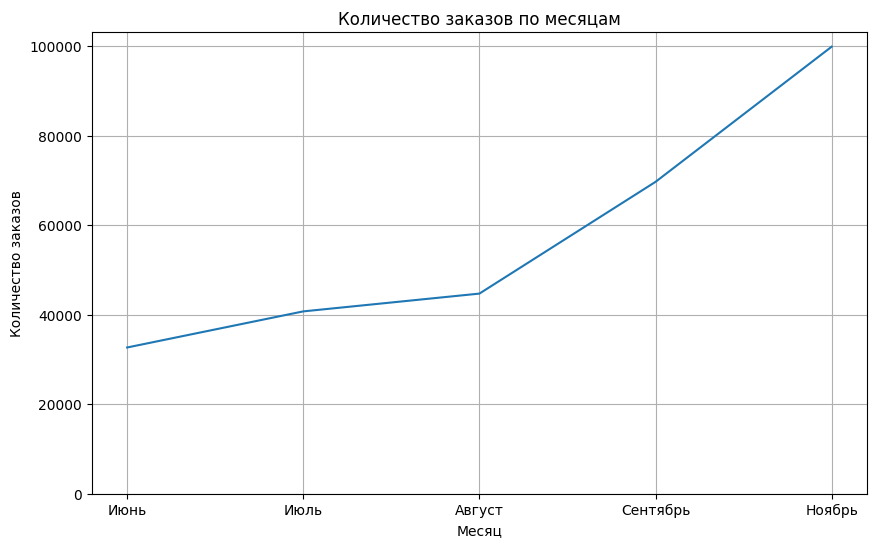

In [116]:
grouped.plot(kind='line',
           title='Количество заказов по месяцам',
           figsize=(10, 6))
plt.grid()
plt.xlabel('Месяц')
plt.xticks(range(6, 11), ['Июнь', 'Июль', 'Август', 'Сентябрь', 'Ноябрь'])
plt.ylabel('Количество заказов')
plt.ylim(ymin=0) 
plt.show()

На визуализации видно, что ближе к осени, начинается резкий рост количества заказов: количество заказов в июне - 32643, количество заказов в октябре - 99836, более чем в 3 раза больше.

Изучим распределение заказов по категориям в зависимости от сезона:

Построим визуализацию:

In [117]:
grouped_summer = df[df['season'] == 'лето'].groupby(['event_type_main'])['order_id'].count()
grouped_summer = grouped_summer.rename('лето')
grouped_autumn = df[df['season'] == 'осень'].groupby(['event_type_main'])['order_id'].count()
grouped_autumn = grouped_autumn.rename('осень')
grouped = pd.merge(grouped_summer, grouped_autumn, on='event_type_main')

summer_sum = df[df['season'] == 'лето']['order_id'].count()
autumn_sum = df[df['season'] == 'осень']['order_id'].count()

grouped['лето'] = grouped['лето'] / summer_sum * 100
grouped['осень'] = grouped['осень'] / autumn_sum * 100

grouped_reset = grouped.reset_index()
display(grouped)

,лето,осень
event_type_main,,
выставки,2.045880,1.437198
другое,27.525383,19.626576
концерты,41.816904,37.347699
спорт,2.548882,11.134308
стендап,5.403460,4.095161
театр,20.426620,25.349421
ёлки,0.232871,1.009636


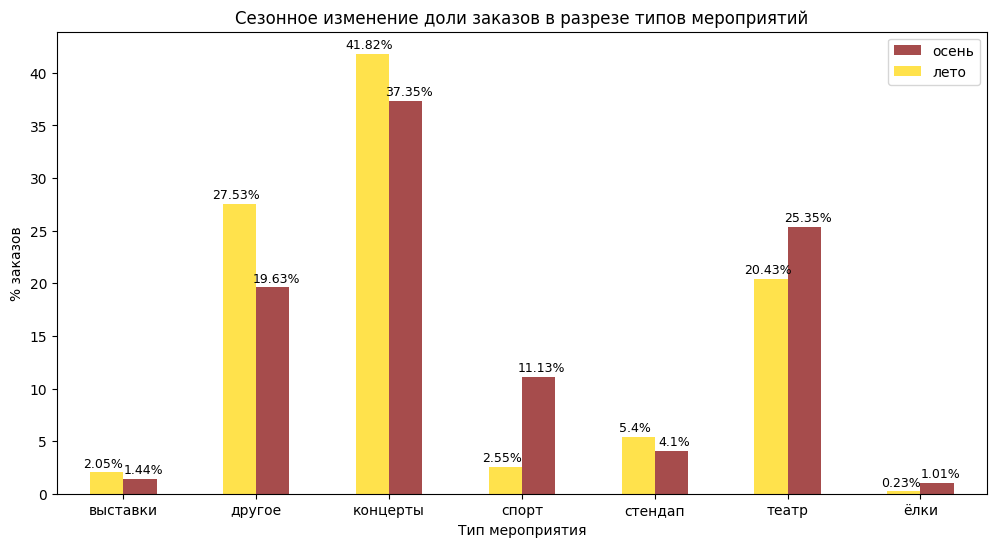

In [118]:
grouped.plot(kind='bar', 
             title='Сезонное изменение доли заказов в разрезе типов мероприятий', 
             legend=True,
             figsize=(12, 6), 
             rot=0,
             color=['gold', 'maroon'],
             alpha=0.7)

cumulative = 0

list_of_events = df['event_type_main'].drop_duplicates().to_list()
list_of_events.sort()

for event in list_of_events:
    cell_value = grouped.loc[event, 'лето']
    plt.text(cumulative-0.15, cell_value+0.5, round(cell_value, 2).astype(str) + '%', ha='center', fontsize=9)
    cumulative = cumulative + 1

cumulative = 0

for event in list_of_events:
    cell_value = grouped.loc[event, 'осень']
    plt.text(cumulative+0.15, cell_value+0.5, round(cell_value, 2).astype(str) + '%', ha='center', fontsize=9)
    cumulative = cumulative + 1

plt.xlabel('Тип мероприятия')
plt.ylabel('% заказов')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

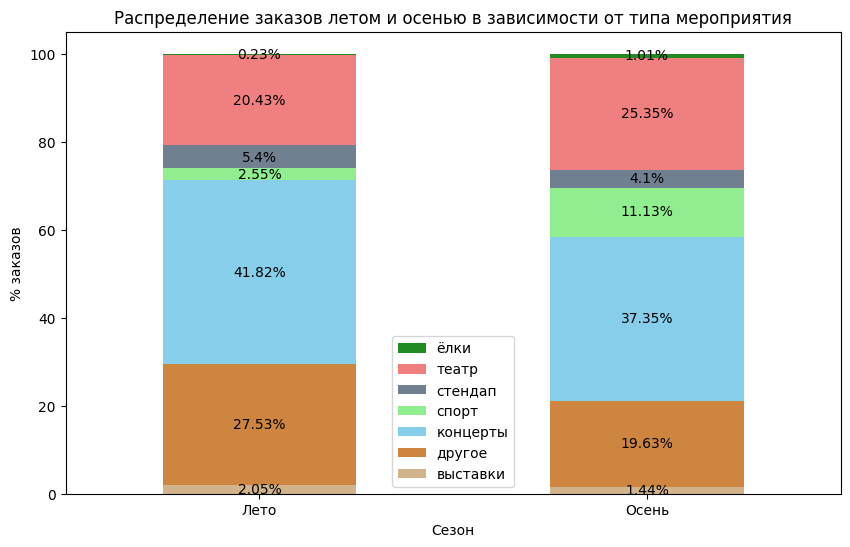

In [119]:
grouped = grouped.T

grouped.plot(kind='bar', 
             title='Распределение заказов летом и осенью в зависимости от типа мероприятия',
             stacked=True, 
             legend=True,
             figsize=(10, 6), 
             rot=0,
             color=['tan', 'peru', 'skyblue', 'lightgreen', 'slategray', 'lightcoral', 'forestgreen'])

cumulative = 0

list_of_events = df['event_type_main'].drop_duplicates().sort_values().to_list()

for event in list_of_events:
    cell_value = grouped.loc['лето', event]
    plt.text(0, cumulative + (cell_value/2)-1, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

cumulative = 0

for event in list_of_events:
    cell_value = grouped.loc['осень', event]
    plt.text(1, cumulative + (cell_value/2)-0.8, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

plt.xlabel('Сезон')
plt.ylabel('% заказов')
plt.xticks([0, 1], ['Лето', 'Осень'])
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

На визуализации видно, что летом, как и осенью, по популярности заказов билетов лидируют "Концерты" (41% летом и 27% осенью), "Театр" (20% летом и 25% осенью) и "Другое" (28% летом и 20% осенью). Осенью уменьшились продажи на "Стендапы" и "Выставки", но увеличились на "Ёлки" и существенно увеличилась доля продаж на "Спортивные мероприятия".

Проверим распределение заказов в зависимости от типа устройства:

In [120]:
grouped_summer = df[df['season'] == 'лето'].groupby(['device_type_canonical'])['order_id'].count()
grouped_summer = grouped_summer.rename('лето')
grouped_autumn = df[df['season'] == 'осень'].groupby(['device_type_canonical'])['order_id'].count()
grouped_autumn = grouped_autumn.rename('осень')
grouped = pd.merge(grouped_summer, grouped_autumn, on='device_type_canonical')

summer_sum = df[df['season'] == 'лето']['order_id'].count()
autumn_sum = df[df['season'] == 'осень']['order_id'].count()

grouped['лето'] = grouped['лето'] / summer_sum * 100
grouped['осень'] = grouped['осень'] / autumn_sum * 100

display(grouped)

,лето,осень
device_type_canonical,,
desktop,19.142864,20.376137
mobile,80.857136,79.623863


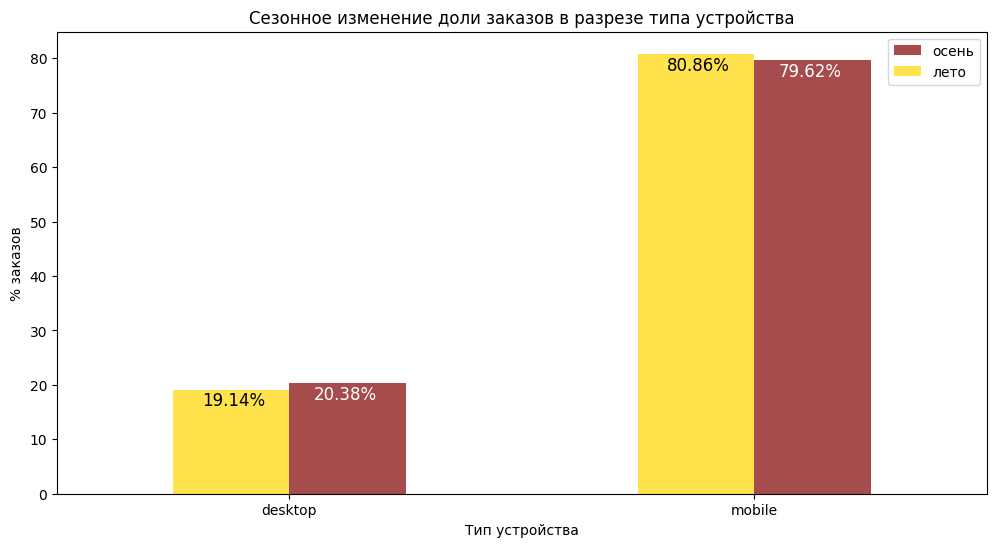

In [121]:
grouped.plot(kind='bar', 
             title='Сезонное изменение доли заказов в разрезе типа устройства', 
             legend=True,
             figsize=(12, 6), 
             rot=0,
             color=['gold', 'maroon'],
             alpha=0.7)

cumulative = 0

list_of_devices = df['device_type_canonical'].drop_duplicates().to_list()
list_of_devices.sort()

for device in list_of_devices:
    cell_value = grouped.loc[device, 'лето']
    plt.text(cumulative-0.12, cell_value-3, round(cell_value, 2).astype(str) + '%', ha='center', fontsize=12)
    cumulative = cumulative + 1

cumulative = 0

for device in list_of_devices:
    cell_value = grouped.loc[device, 'осень']
    plt.text(cumulative+0.12, cell_value-3, round(cell_value, 2).astype(str) + '%', ha='center', fontsize=12, color='white')
    cumulative = cumulative + 1

plt.xlabel('Тип устройства')
plt.ylabel('% заказов')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

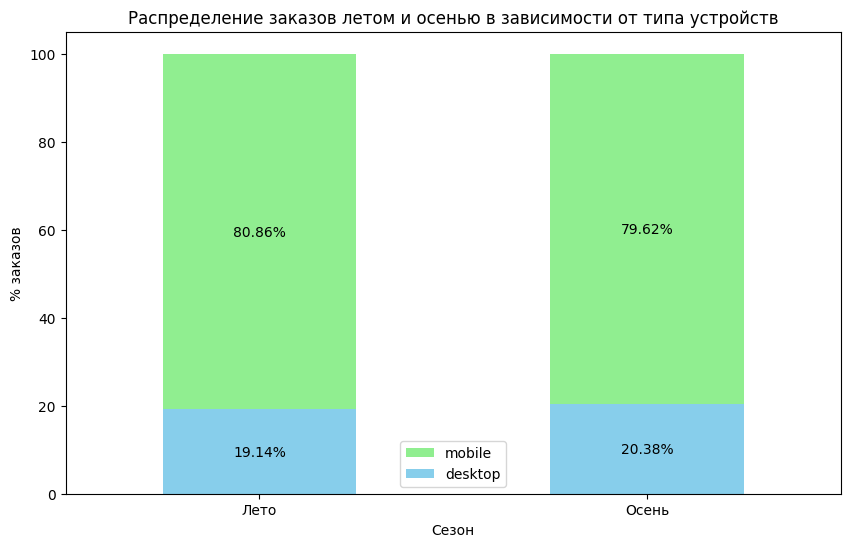

In [122]:
grouped = grouped.T

grouped.plot(kind='bar', 
             title='Распределение заказов летом и осенью в зависимости от типа устройств',
             stacked=True, 
             legend=True,
             figsize=(10, 6), 
             rot=0,
             color=['skyblue', 'lightgreen'])

cumulative = 0

list_of_events = df['device_type_canonical'].drop_duplicates().sort_values().to_list()

for event in list_of_events:
    cell_value = grouped.loc['лето', event]
    plt.text(0, cumulative + (cell_value/2)-1, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

cumulative = 0

for event in list_of_events:
    cell_value = grouped.loc['осень', event]
    plt.text(1, cumulative + (cell_value/2)-1, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

plt.xlabel('Сезон')
plt.ylabel('% заказов')
plt.xticks([0, 1], ['Лето', 'Осень'])
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

И летом и осенью большая часть заказов сделаны с мобильных устройств (81% летом и 80% осенью).

Проверим распределение заказов в зависимости от возрастного рейтинга мероприятия:

In [123]:
grouped_summer = df[df['season'] == 'лето'].groupby(['age_limit'])['order_id'].count()
grouped_summer = grouped_summer.rename('лето')
grouped_autumn = df[df['season'] == 'осень'].groupby(['age_limit'])['order_id'].count()
grouped_autumn = grouped_autumn.rename('осень')
grouped = pd.merge(grouped_summer, grouped_autumn, on='age_limit')

summer_sum = df[df['season'] == 'лето']['order_id'].count()
autumn_sum = df[df['season'] == 'осень']['order_id'].count()

grouped['лето'] = grouped['лето'] / summer_sum * 100
grouped['осень'] = grouped['осень'] / autumn_sum * 100

display(grouped)

,лето,осень
age_limit,,
0,18.291826,23.508840
6,18.578893,17.794841
12,19.807606,22.043924
16,28.125767,26.178597
18,15.195908,10.473798


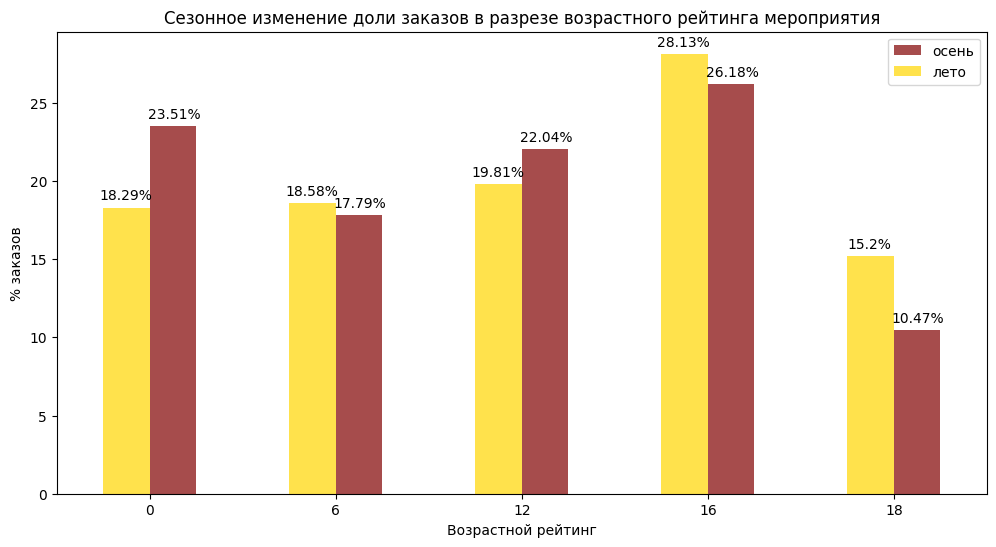

In [124]:
grouped.plot(kind='bar', 
             title='Сезонное изменение доли заказов в разрезе возрастного рейтинга мероприятия', 
             legend=True,
             figsize=(12, 6), 
             rot=0,
             color=['gold', 'maroon'],
             alpha=0.7)

cumulative = 0

list_of_age_limits = df['age_limit'].drop_duplicates().to_list()
list_of_age_limits.sort()

for age_limit in list_of_age_limits:
    cell_value = grouped.loc[age_limit, 'лето']
    plt.text(cumulative-0.13, cell_value+0.5, round(cell_value, 2).astype(str) + '%', ha='center')
    cumulative = cumulative + 1

cumulative = 0

for age_limit in list_of_age_limits:
    cell_value = grouped.loc[age_limit, 'осень']
    plt.text(cumulative+0.13, cell_value+0.5, round(cell_value, 2).astype(str) + '%', ha='center')
    cumulative = cumulative + 1

plt.xlabel('Возрастной рейтинг')
plt.ylabel('% заказов')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

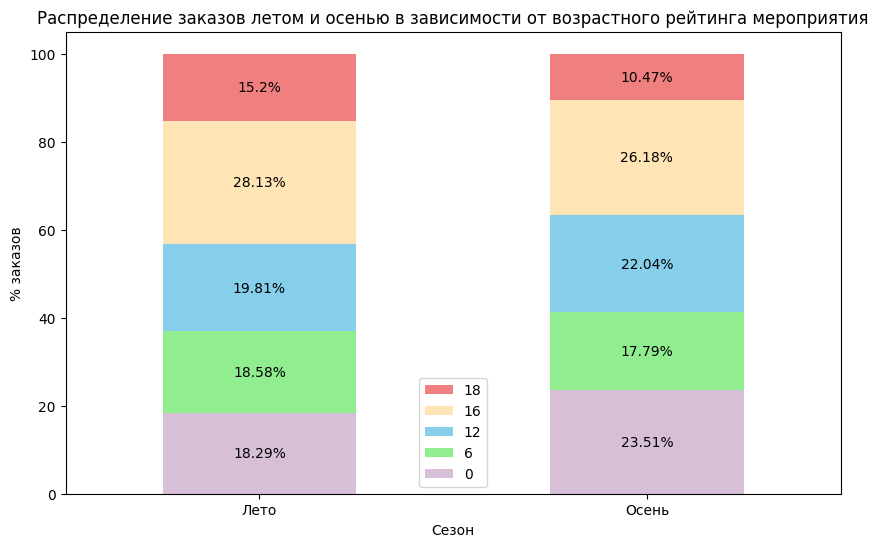

In [125]:
grouped = grouped.T

grouped.plot(kind='bar', 
             title='Распределение заказов летом и осенью в зависимости от возрастного рейтинга мероприятия',
             stacked=True, 
             legend=True,
             figsize=(10, 6), 
             rot=0,
             color=['thistle', 'lightgreen', 'skyblue', 'moccasin', 'lightcoral'])

cumulative = 0

for age_limit in list_of_age_limits:
    cell_value = grouped.loc['лето', age_limit]
    plt.text(0, cumulative + (cell_value/2)-1, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

cumulative = 0

for age_limit in list_of_age_limits:
    cell_value = grouped.loc['осень', age_limit]
    plt.text(1, cumulative + (cell_value/2)-1, (round(cell_value, 2)).astype(str) + '%', ha='center')
    cumulative = cumulative + cell_value

plt.xlabel('Сезон')
plt.ylabel('% заказов')
plt.xticks([0, 1], ['Лето', 'Осень'])
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels), loc='lower center')
plt.show()

Летом немного лучше продаются билеты с возрастным рейтингом "6+" (19% летом и 18% осенью), "16+" (28% летом и 26% осенью) и 18+ (15% летом и 10% осенью),
в то время, как осенью увеличилась доля продаж ны мероприятия с рейтингом "12+" (20% летом и 22% осенью) и "0+" (18% летом и 23% осенью).

Рассмотрим среднюю стоимость билета по типам мероприятия:

In [126]:
grouped_summer = df[df['season'] == 'лето'].groupby(['event_type_main'])['one_ticket_revenue_rub'].mean()
grouped_summer = grouped_summer.rename('лето')
grouped_autumn = df[df['season'] == 'осень'].groupby(['event_type_main'])['one_ticket_revenue_rub'].mean()
grouped_autumn = grouped_autumn.rename('осень')
grouped = pd.merge(grouped_summer, grouped_autumn, on='event_type_main')

grouped = grouped.sort_values(by='лето')

display(grouped)

,лето,осень
event_type_main,,
спорт,51.986228,49.998950
другое,80.549646,77.002181
выставки,86.416198,91.066619
театр,218.671685,179.696929
стендап,221.284353,232.626359
ёлки,274.749549,234.216151
концерты,297.315305,273.786866


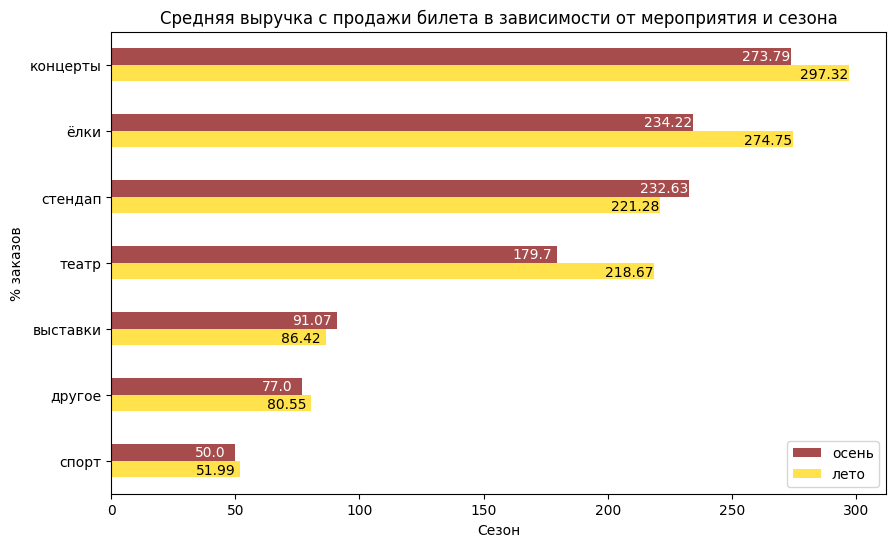

In [127]:
grouped.plot(kind='barh', 
             title='Средняя выручка с продажи билета в зависимости от мероприятия и сезона', 
             legend=True,
             figsize=(10, 6), 
             rot=0,
             color=['gold', 'maroon'],
             alpha=0.7)

cumulative = 0

list_of_events = ['спорт', 'другое', 'выставки', 'театр', 'стендап', 'ёлки', 'концерты']

for event in list_of_events:
    cell_value = grouped.loc[event, 'лето']
    plt.text(cell_value-10, cumulative - 0.2, round(cell_value, 2), ha='center')
    cumulative = cumulative + 1

cumulative = 0

for event in list_of_events:
    cell_value = grouped.loc[event, 'осень']
    plt.text(cell_value-10, cumulative + 0.07, round(cell_value, 2), ha='center', color='white')
    cumulative = cumulative + 1

plt.xlabel('Сезон')
plt.ylabel('% заказов')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(reversed(handles), reversed(labels))
plt.show()

Средняя стоимость билетов на 3 из 4 самых дорогих мероприятия (Концерты, Ёлки и Театр) осенью упала, в то время как стоимость за билет на Стендап повысилась, также, осенью повысилась стоимость на Выставки.

In [128]:
grouped['difference'] = round((grouped['осень'] - grouped['лето']) / grouped['лето'] * 100, 2)

display(grouped)

,лето,осень,difference
event_type_main,,,
спорт,51.986228,49.998950,-3.82
другое,80.549646,77.002181,-4.40
выставки,86.416198,91.066619,5.38
театр,218.671685,179.696929,-17.82
стендап,221.284353,232.626359,5.13
ёлки,274.749549,234.216151,-14.75
концерты,297.315305,273.786866,-7.91


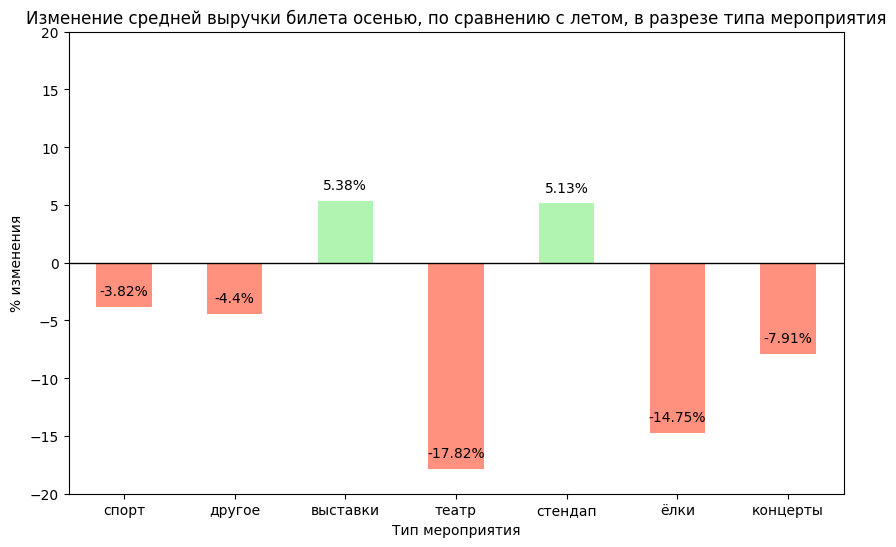

In [129]:
grouped['difference'].plot(kind='bar', 
             title='Изменение средней выручки билета осенью, по сравнению с летом, в разрезе типа мероприятия',
             figsize=(10, 6), 
             rot=0,
             color=['tomato', 'tomato', 'lightgreen', 'tomato', 'lightgreen', 'tomato', 'tomato'],
             alpha=0.7)

cumulative=0

for event in list_of_events:
    cell_value = grouped.loc[event, 'difference']
    plt.text(cumulative, cell_value+1, cell_value.astype(str) + '%', ha='center')
    cumulative = cumulative + 1

plt.axhline(0, color='black', linewidth=1)

#plt.grid(axis='y', alpha=0.7)
plt.xlabel('Тип мероприятия')
plt.ylabel('% изменения')
plt.ylim(ymin=-20, ymax=20)
plt.show()

#### Итог анализа распределения заказов по сегментам и их сезонных изменениях:

После проведенного анализа распределения заказов по сегментам, можно отметить следующие сезонные изменения:
- С осени начинает резко расти количество заказов, это может быть связано с тем, что к осени люди возвращаются с отпусков и, из-за похолодания меньше гуляют и выбирают альтернативное времяпровождения покупая билеты на мероприятия, а также, причиной могут стать осенние скидки и акции на билеты;
- Вне зависимости от сезона, самыми популярными категориями мероприятий остаются: "Концерты", "Другое" и "Театр";
- Также, вне зависимости от сезона большая доля (80%) заказов сделаны с мобильных устройств, что не удивительно, так как мобильные устройства доступнее, приложения в них чаще удобнее, чем на ПК, а также, из-за того что мобильные устройства всегда под рукой, можно сделать спонтанный заказ;
- И летом и осенью распределенеие заказов в зависимости от возрастного рейтинга остается примерно равным, только осенью немного увеличивается доля продаж на мероприятия с рейтингом "0+" (18% летом и 23% осенью) и уменьшается доля продаж на мероприятия с рейтингом "18+" (15% летом и 10% осенью), причиной этого может быть окончание летних каникул: дети возвращаются к родителям после летнего отдыха (например, у бабушки или в лагере) и родители чаще начинают покупать билеты на более "детские" мероприятия.
- Осенью немного выросла выручка с одного билета на "Выставки" и "Стендапы" (+5%) и существенно упала с билетов в "Театр" (-18%), на "Ёлки" (-15%) и "Концерты" (-8%).

### Осенняя активность пользователей

Изучим активность пользователей осенью 2024 года. В вашем распоряжении данные за два осенних месяца.

Проанализируем динамику изменений по дням для:
- общего числа заказов;
- количество активных пользователей DAU;
- среднего числа заказов на одного пользователя;
- средней стоимости одного билета.

Для начала, создадим сводную таблицу с агрегацией нужных полей по дням:

In [130]:
grouped = df[df['season'] == 'осень'].groupby('created_dt_msk').agg({'order_id': 'count', 'user_id': 'nunique', 'one_ticket_revenue_rub': 'mean'})
grouped['orders_per_user'] = grouped['order_id'] / grouped['user_id']

display(grouped.head())

,order_id,user_id,one_ticket_revenue_rub,orders_per_user
created_dt_msk,,,,
2024-09-01,1346,569,206.693099,2.365554
2024-09-02,1381,574,192.450073,2.405923
2024-09-03,5112,778,80.951592,6.570694
2024-09-04,1774,687,178.954224,2.582242
2024-09-05,1943,740,191.735323,2.625676


Далее создадим визуализации (голубым отмечены будние дни, зеленым - выходные):

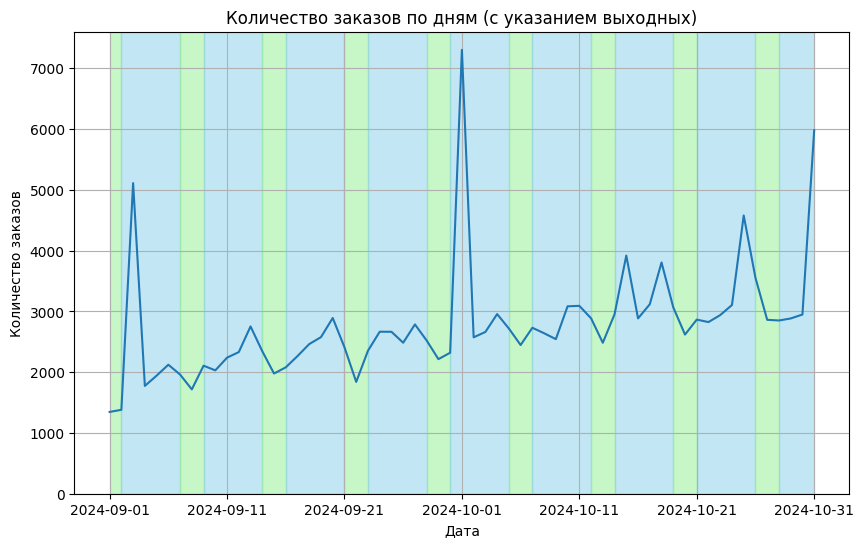

In [131]:
grouped['order_id'].plot(kind='line',
           title='Количество заказов по дням (c указанием выходных)',
           figsize=(10, 6))

plt.axvspan(0, 1, color='lightgreen', alpha=0.5)

work_day = 1
dayoff = 6

for i in range(8):
    plt.axvspan(work_day, work_day+5, color='skyblue', alpha=0.5)
    work_day = work_day + 7
    plt.axvspan(dayoff, dayoff+2, color='lightgreen', alpha=0.5)
    dayoff = dayoff + 7
    
plt.axvspan(work_day, work_day+3, color='skyblue', alpha=0.5)

plt.grid()
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.ylim(ymin=0) 
plt.show()

На визуализации видно, что пик количества заказов приходится на начало каждого месяца. Максимальное количество заказов было достигнуто 03-09-2024, 31-10-2024 и рекордный пик был 01-10-2024 и составил 7289 заказов. Также, видно что количество заказов вырастает в будние дни и падает в выходные.

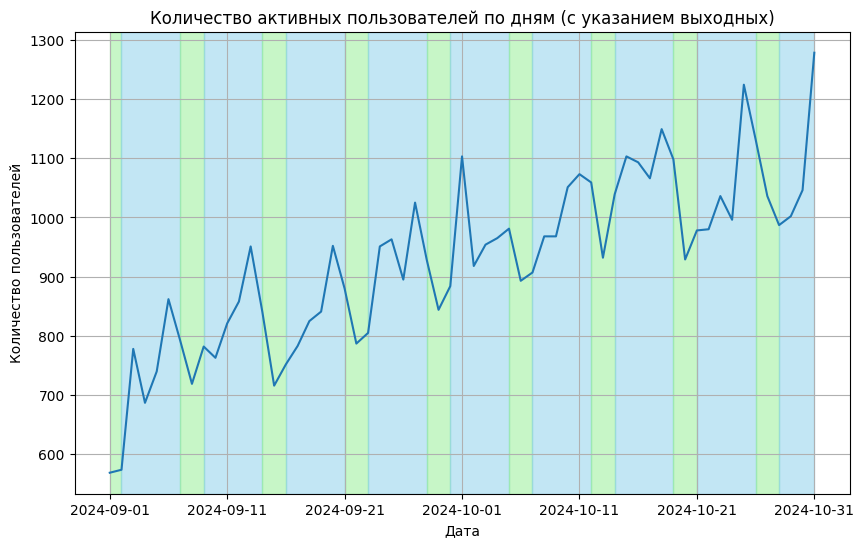

In [132]:
grouped['user_id'].plot(kind='line',
           title='Количество активных пользователей по дням (c указанием выходных)',
           figsize=(10, 6))
plt.grid()

plt.axvspan(0, 1, color='lightgreen', alpha=0.5)

work_day = 1
dayoff = 6

for i in range(8):
    plt.axvspan(work_day, work_day+5, color='skyblue', alpha=0.5)
    work_day = work_day + 7
    plt.axvspan(dayoff, dayoff+2, color='lightgreen', alpha=0.5)
    dayoff = dayoff + 7
    
plt.axvspan(work_day, work_day+3, color='skyblue', alpha=0.5)

plt.xlabel('Дата')
plt.ylabel('Количество пользователей')
plt.show()

Количество активных пользователей осенью имеет скачкообразный характер, каждую неделю, в рабочие дни количество активных пользователей растет и падает на выходных, но прослеживается общая тенденция к росту количества пользователей. Это подтверждает также то, что достигнутый пик количества пользователей был в последний день отслеживаемого периода - 31-10-2024 (будний день).

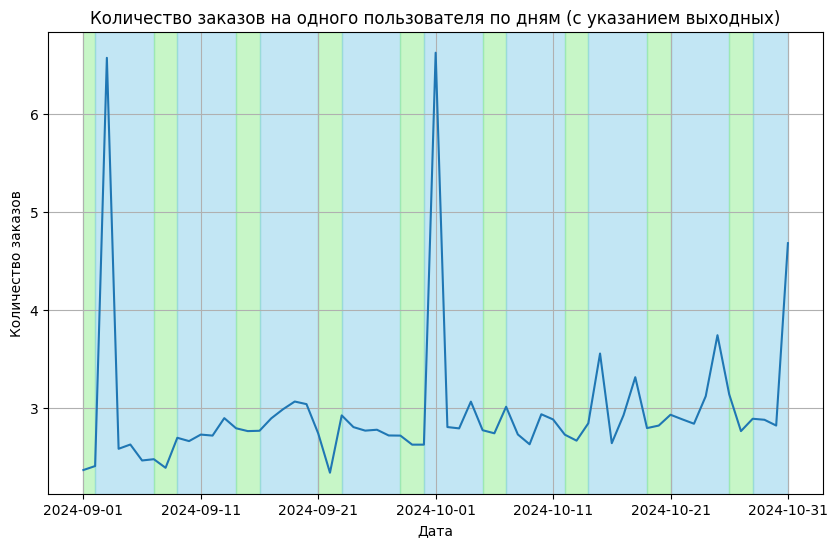

In [133]:
grouped['orders_per_user'].plot(kind='line',
           title='Количество заказов на одного пользователя по дням (c указанием выходных)',
           figsize=(10, 6))

plt.axvspan(0, 1, color='lightgreen', alpha=0.5)

work_day = 1
dayoff = 6

for i in range(8):
    plt.axvspan(work_day, work_day+5, color='skyblue', alpha=0.5)
    work_day = work_day + 7
    plt.axvspan(dayoff, dayoff+2, color='lightgreen', alpha=0.5)
    dayoff = dayoff + 7
    
plt.axvspan(work_day, work_day+3, color='skyblue', alpha=0.5)

plt.grid()
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.show()

Видно, что пик количества заказов на человека приходится на начало каждого месяца (более 6 заказов) 03-09-2024 и 01-10-2024 это связано с большим количеством заказов именно в эти дни.

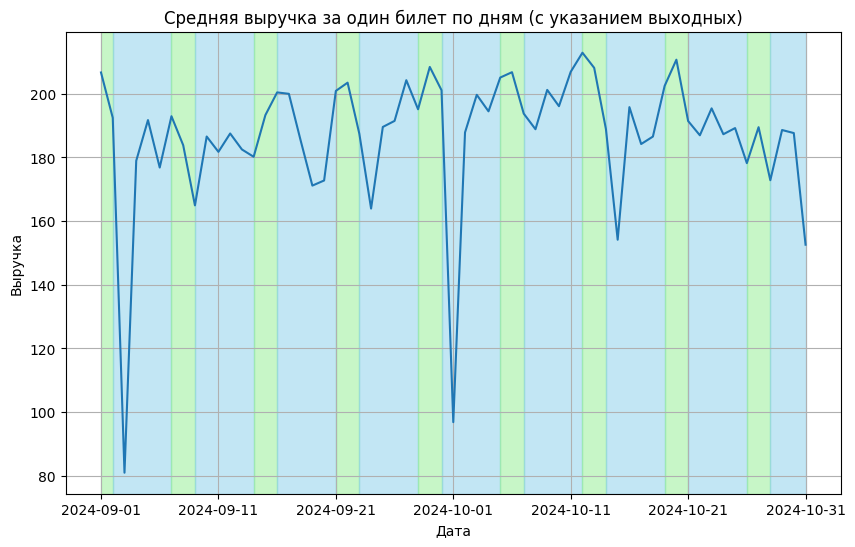

In [134]:
grouped['one_ticket_revenue_rub'].plot(kind='line',
           title='Средняя выручка за один билет по дням (c указанием выходных)',
           figsize=(10, 6))

plt.axvspan(0, 1, color='lightgreen', alpha=0.5)

work_day = 1
dayoff = 6

for i in range(8):
    plt.axvspan(work_day, work_day+5, color='skyblue', alpha=0.5)
    work_day = work_day + 7
    plt.axvspan(dayoff, dayoff+2, color='lightgreen', alpha=0.5)
    dayoff = dayoff + 7
    
plt.axvspan(work_day, work_day+3, color='skyblue', alpha=0.5)

plt.grid()
plt.xlabel('Дата')
plt.ylabel('Выручка')
plt.show()

Выручка за один билет в даты 03-09-2024 и 01-10-2024 достигла рекордно низких показателей. Также, можно проследить, что выручка за один билет больше именно в выходные.

#### Итог анализа осенней активности пользователей:

После проведенного анализа осенней активности пользователей, можно отметить следующее:
- Общее количество заказов и количество заказов на одного человека в среднем выше в будние дни. 03-09-2024 и 31-10-2024 было достигнуто более 5-6 тыс. заказов в день и рекордный пик зарегестрирован 01-10-2024, составивший более 7 тыс. заказов;
- Количество активных пользователей также растет в будни и падает на выходных, но прослеживается общая тенденция к росту количества пользователей. Достигнутый пик количества пользователей был в последний день отслеживаемого периода - 31-10-2024 (будний день);
- Количество заказов на одного человека 03-10-2024 и 01-10-2024 достигает более 6 заказов, так как в эти дни в принципе было сделано рекордное количество заказов;
- Динамика средней выручки за один билет напоминает перевернутый линейный график общего количества заказов, то есть, в дни когда было сделано наибольшее количество заказов - наименьшая выручка по дням (03-09-2024 и 31-10-2024). Это может объясняться акциями или скидками в эти дни, которые существенно снизили стоимость билетов и соответственно повлияли на количество заказов. Также, можно проследить, что выручка за один билет больше именно в выходные.

### Популярные события и партнёры

После изучения изменения популярности событий и пользовательской активности осенью 2024 года, посмотрим, как события распределены по регионам и партнёрам. Это позволит выделить ключевые регионы и партнёров, которые вносят наибольший вклад в выручку.

In [135]:
grouped = df.groupby('region_name').agg({'event_name': 'nunique', 'order_id': 'count'})
all_events = df['event_name'].nunique()
all_orders = df['order_id'].count()

grouped['event_share'] = round(grouped['event_name'] / all_events * 100, 2)
grouped['orders_share'] = round(grouped['order_id'] / all_orders * 100, 2)

In [136]:
grouped = grouped.sort_values(by='event_share', ascending = False)

grouped_first_10_by_events = grouped[['event_share']].iloc[:5].reset_index()
rest_of_events = 100 - grouped_first_10_by_events['event_share'].sum()
events_adder = pd.DataFrame([{'region_name': 'Остальные', 'event_share': rest_of_events}])
grouped_first_10_by_events = pd.concat([grouped_first_10_by_events, events_adder], ignore_index=True)

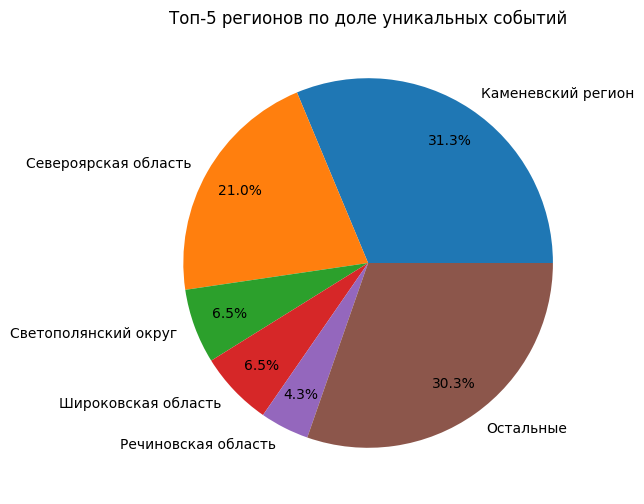

In [137]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(grouped_first_10_by_events['event_share'], labels=grouped_first_10_by_events['region_name'], pctdistance=0.8, autopct='%1.1f%%')    

# Настраиваем отображение
plt.title('Топ-5 регионов по доле уникальных событий')
plt.show()

На пайчарте видно, что среди регионов имеются определенные лидеры по количеству проводимых уникальных мероприятий, это Североярская область и Каменевский регион, доля уникальных мероприятий только в этих регионах составляет 21% и 31% соответственно. 70% всех проведенных мероприятий приходится на топ-5 регионов.

In [138]:
grouped = grouped.sort_values(by='orders_share', ascending = False)

grouped_first_10_by_orders = grouped[['orders_share']].iloc[:5].reset_index()
rest_of_events = 100 - grouped_first_10_by_orders['orders_share'].sum()
orders_adder = pd.DataFrame([{'region_name': 'Остальные', 'orders_share': rest_of_events}])
grouped_first_10_by_events = pd.concat([grouped_first_10_by_orders, orders_adder], ignore_index=True)

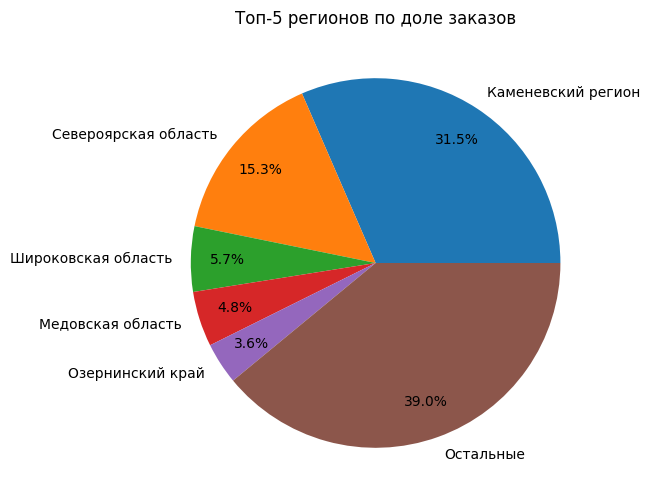

In [139]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(grouped_first_10_by_events['orders_share'], labels=grouped_first_10_by_events['region_name'], pctdistance=0.8, autopct='%1.1f%%')    

# Настраиваем отображение
plt.title('Топ-5 регионов по доле заказов')
plt.show()

Как и ранее, лидеры по количеству заказов - Североярская область и Каменевский регион, доля от всех заказов в этих регионах составляет 15% и 31% соответственно. На топ-5 регионов приходится более 60% всех заказов.

Перейдем к исследованию билетных партнеров:

In [140]:
grouped = df.groupby('service_name').agg({'event_name': 'nunique', 'order_id': 'count', 'revenue': 'sum'})
all_events = df['event_name'].nunique()
all_orders = df['order_id'].count()
all_revenue = df['revenue'].sum()

grouped['event_share'] = round(grouped['event_name'] / all_events * 100, 2)
grouped['orders_share'] = round(grouped['order_id'] / all_orders * 100, 2)
grouped['revenue_share'] = round(grouped['revenue'] / all_revenue * 100, 2)

In [141]:
grouped = grouped.sort_values(by='event_share', ascending = False)

grouped_first_10_by_events = grouped[['event_share']].iloc[:5].reset_index()
rest_of_events = 100 - grouped_first_10_by_events['event_share'].sum()
events_adder = pd.DataFrame([{'service_name': 'Остальные', 'event_share': rest_of_events}])
grouped_first_10_by_events = pd.concat([grouped_first_10_by_events, events_adder], ignore_index=True)

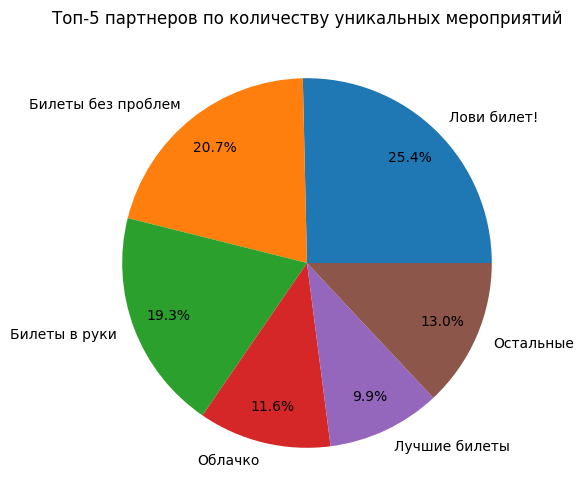

In [142]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(grouped_first_10_by_events['event_share'], labels=grouped_first_10_by_events['service_name'], pctdistance=0.8, autopct='%1.1f%%')    

# Настраиваем отображение
plt.title('Топ-5 партнеров по количеству уникальных мероприятий')
plt.show()

По количеству уникальных мероприятий имеется 3 лидера среди билетных партнеров: Лови билет! - 25%, Билеты без проблем - 21% и Билеты в руки - 19%. 87% заказов на уникальные мероприятия приходится на топ-5 билетных партнеров.

In [143]:
grouped = grouped.sort_values(by='orders_share', ascending = False)

grouped_first_10_by_orders = grouped[['orders_share']].iloc[:5].reset_index()
rest_of_orders = 100 - grouped_first_10_by_orders['orders_share'].sum()
order_adder = pd.DataFrame([{'service_name': 'Остальные', 'orders_share': rest_of_orders}])
grouped_first_10_by_orders = pd.concat([grouped_first_10_by_orders, order_adder], ignore_index=True)

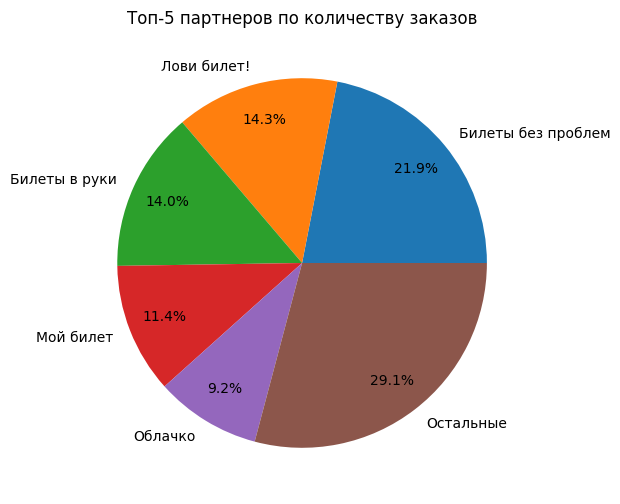

In [144]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(grouped_first_10_by_orders['orders_share'], labels=grouped_first_10_by_orders['service_name'], pctdistance=0.8, autopct='%1.1f%%')    

# Настраиваем отображение
plt.title('Топ-5 партнеров по количеству заказов')
plt.show()

По количеству заказов также прослеживаются лидеры: Билеты без проблем - 22%, Лови билет! - 14% и Билеты в руки - 14%. Больше 70% всех заказов приходится на топ-5 билетных партнеров.

In [145]:
grouped = grouped.sort_values(by='revenue_share', ascending = False)

grouped_first_10_by_revenue = grouped[['revenue_share']].iloc[:5].reset_index()
rest_of_revenue = 100 - grouped_first_10_by_revenue['revenue_share'].sum()
revenue_adder = pd.DataFrame([{'service_name': 'Остальные', 'revenue_share': rest_of_revenue}])
grouped_first_10_by_revenue = pd.concat([grouped_first_10_by_revenue, revenue_adder], ignore_index=True)

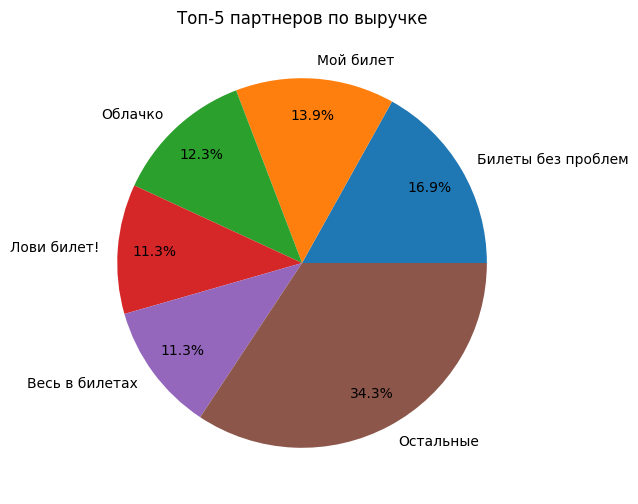

In [146]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(grouped_first_10_by_revenue['revenue_share'], labels=grouped_first_10_by_revenue['service_name'], pctdistance=0.8, autopct='%1.1f%%')    

# Настраиваем отображение
plt.title('Топ-5 партнеров по выручке')
plt.show()

66% всей выручки приходится на топ-5 партнеров, лидеры из них: Билеты без проблем - 17%, Мой билет - 14% и Облачко - 12%.

#### Итог анализа популярных событий и партнёров

После проведенного анализа популярных событий и партнёров, было выявлено:
- По доле проведения уникальных событий Топ-2 региона составляют более 50% от всех уникальных событий: Каменевский регион - 31% и Североярская область 21%;
- Те же регионы лидируют и по доле заказов: Каменевский регион - 31% и Североярская область - 15%;
- Среди билетных партнеров также есть лидеры по количеству уникальных мероприятий и заказов: Лови билет - 25% доля мероприятий и 14% доля заказов, Билеты без проблем - 21% доля мероприятий и 22% доля заказов, Билеты в руки - 20% доля мероприятий и 14% доля заказов. 87% заказов на уникальные мероприятия и 70% всех заказов приходится на топ-5 билетных партнеров. Также, более 65% всей выручки приходится на топ-5 партнеров, лидеры из которых: Билеты без проблем - 17%, Мой билет - 14% и Облачко - 12%.

## Статистический анализ данных

Проверим несколько гипотез относительно активности пользователей мобильных и стационарных устройств:
- Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств;
- Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

Гипотеза:
- Нулевая гипотеза H₀: Среднее количество заказов на одного пользователя у пользователей мобильного приложения и стационарных устройств - одинаково;
- Альтернативная гипотеза H₁: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств.

Для начала оставим только нужную нам информацию и проверим, нет ли дублирующихся пользователей в обеих группах:

In [147]:
participants = df[df['season'] == 'осень'][['user_id', 'device_type_canonical', 'order_id']]
participants = participants.groupby(['user_id', 'device_type_canonical'])['order_id'].count().reset_index()

user_duplicates = participants.groupby('user_id').agg({'device_type_canonical': 'nunique'}).query('device_type_canonical > 1').shape[0]

print(f'Было выявлено {user_duplicates} дублирующихся по группам пользователей')

participants = participants.drop_duplicates('user_id', keep=False)
user_duplicates = participants.groupby('user_id').agg({'device_type_canonical': 'nunique'}).query('device_type_canonical > 1').shape[0]

print(f'После удаления осталось {user_duplicates} дублирующихся по группам пользователей')

Было выявлено 3259 дублирующихся по группам пользователей
После удаления осталось 0 дублирующихся по группам пользователей


In [148]:
user_mobile = participants[participants['device_type_canonical'] == 'mobile']
user_desktop = participants[participants['device_type_canonical'] == 'desktop']

order_mobile_count = user_mobile['order_id'].sum()
order_desktop_count = user_desktop['order_id'].sum()

all_users = order_mobile_count + order_desktop_count

print(f'Всего осталась выборка из {participants.shape[0]} человек: пользователи мобильных устройств - {user_mobile.shape[0]} и {user_desktop.shape[0]} - пользователи стационарных.')
print(f'Общее количество заказов: {all_users}, из них {order_mobile_count} c мобильных устройств и {order_desktop_count} со стационарных.')

Всего осталась выборка из 12560 человек: пользователи мобильных устройств - 10936 и 1624 - пользователи стационарных.
Общее количество заказов: 34552, из них 31350 c мобильных устройств и 3202 со стационарных.


Теперь проверим разницу между группами с помощью формулы: 

$$P = 100 \cdot  \frac{|A − B|}{A}$$

In [149]:
P = round(100 * fabs(user_mobile.shape[0] - user_desktop.shape[0]) / user_mobile.shape[0], 2)
print(f'Разница между группами составляет {P}%')

Разница между группами составляет 85.15%


Так как, мы анализируем среднее и при его расчете не так важен размер выборок, то при попытке приравнять их размеры, можем еще больше исказить результаты. Принято решение оставить размеры выборок как есть. Проверим выборочные дисперсии двух групп:

In [150]:
D_mobile = round(statistics.variance(user_mobile['order_id']), 2)
D_desktop = round(statistics.variance(user_desktop['order_id']), 2)

print(f'Выборочная дисперсия по пользователям мобильных устройств - {D_mobile}, выборочная дисперсия по пользователям стационарных устройств - {D_desktop}')

Выборочная дисперсия по пользователям мобильных устройств - 16.88, выборочная дисперсия по пользователям стационарных устройств - 9.33


Так как выборочные дисперсии двух групп значительно различаются, визуализируем распределение обеих групп:

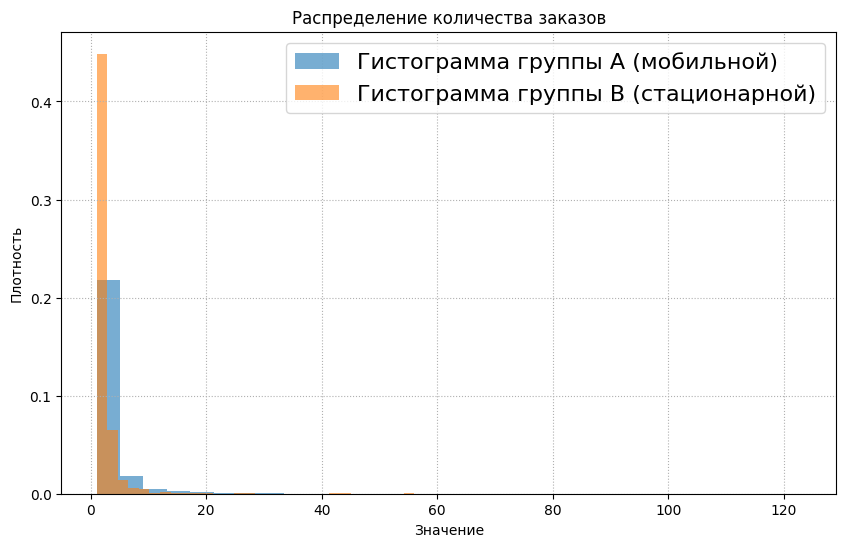

In [151]:
plt.figure(figsize=(10,6))
plt.hist(user_mobile['order_id'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы А (мобильной)')
plt.hist(user_desktop['order_id'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы В (стационарной)')
plt.title(
    'Распределение количества заказов'
)
plt.xlabel('Значение')
plt.ylabel('Плотность')
plt.legend(fontsize=16)
plt.grid(ls=':')
plt.show()

В обеих групп имеются сильные выбросы. Исключим их.

In [152]:
mobile_qn = user_mobile['order_id'].quantile(0.99)
desktop_qn = user_desktop['order_id'].quantile(0.99)

user_mobile = user_mobile[user_mobile.order_id < mobile_qn]
user_desktop = user_desktop[user_desktop.order_id < desktop_qn]

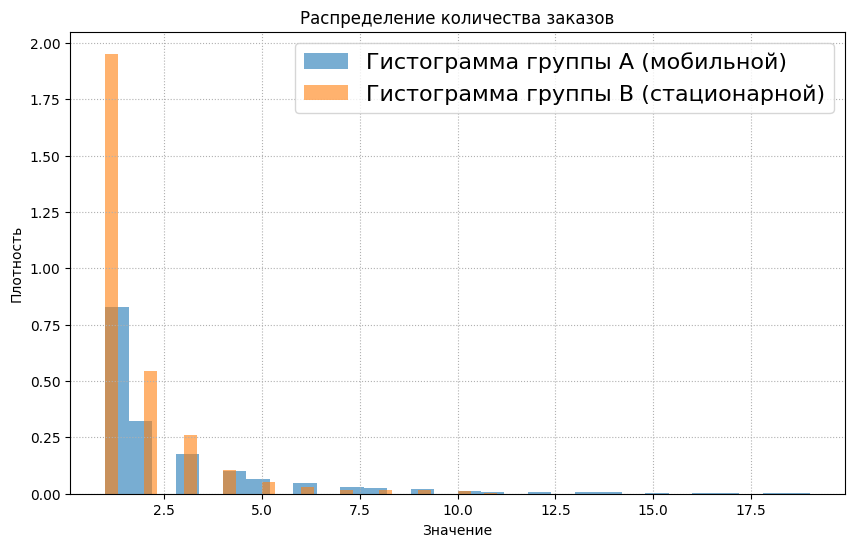

In [153]:
plt.figure(figsize=(10,6))
plt.hist(user_mobile['order_id'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы А (мобильной)')
plt.hist(user_desktop['order_id'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы В (стационарной)')
plt.title(
    'Распределение количества заказов'
)
plt.xlabel('Значение')
plt.ylabel('Плотность')
plt.legend(fontsize=16)
plt.grid(ls=':')
plt.show()

Cильные выбросы ушли, снова можно проверить выборочную дисперсию:

In [154]:
D_mobile = round(statistics.variance(user_mobile['order_id']), 2)
D_desktop = round(statistics.variance(user_desktop['order_id']), 2)

print(f'Выборочная дисперсия по пользователям мобильных устройств - {D_mobile}, выборочная дисперсия по пользователям стационарных устройств - {D_desktop}')

Выборочная дисперсия по пользователям мобильных устройств - 7.01, выборочная дисперсия по пользователям стационарных устройств - 1.96


Выборочные дисперсии все еще значительно отличаются, нужно использовать t-тест Уэлча:

In [155]:
metric_a = user_mobile['order_id'] ## выборка целевой метрики для группы A
metric_b = user_desktop['order_id'] ## выборка целевой метрики для группы B

alpha = 0.05
stat_ttest, p_value_welch_ttest = ttest_ind(
    metric_b,
    metric_a, 
    alternative='greater', # так как H1: a (мобильн) > b (стационарн) 
    equal_var=False,
)

if p_value_welch_ttest>alpha:
    print(f'p-value теста Уэлча = {round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза находит подтверждение!')
    print('Выборочные средние в группах A и B равны')
else:
    print(f'p-value теста Уэлча = {round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза не находит подтверждения!')
    print('Выборочные средние в группах A и B не равны')

p-value теста Уэлча = 1.0
Нулевая гипотеза находит подтверждение!
Выборочные средние в группах A и B равны


Статистический t-тест Уэлча подтвердил нулевую гипотезу, следовательно доказал, что среднее количество заказов на человека не зависит от типа устройства.

Переходим к следующему тесту.

Гипотеза:
- Нулевая гипотеза H₀: Среднее время между заказами пользователей мобильных и стационарных приложений - одинаково;
- Альтернативная гипотеза H₁: Среднее время между заказами пользователей мобильных приложений выше, по сравнению с пользователями стационарных устройств.

Удалим строки с пропусками по столбцу `days_since_prev` и для всех оставшихся пользователей найдем среднее количество дней между покупками, а также, удалим пользователей встречающихся в обеих группах.

In [156]:
participants = df[df['season'] == 'осень'][['user_id', 'device_type_canonical', 'days_since_prev']].dropna(subset=['days_since_prev'])
participants = participants.groupby(['user_id', 'device_type_canonical'])['days_since_prev'].mean().reset_index()
participants = participants.drop_duplicates('user_id', keep=False)

user_duplicates = participants.groupby('user_id').agg({'device_type_canonical': 'nunique'}).query('device_type_canonical > 1').shape[0]

print(f'Было выявлено {user_duplicates} дублирующихся по группам пользователей')

Было выявлено 0 дублирующихся по группам пользователей


In [157]:
user_mobile = participants[participants['device_type_canonical'] == 'mobile']
user_desktop = participants[participants['device_type_canonical'] == 'desktop']

all_users = order_mobile_count + order_desktop_count

print(f'Всего осталась выборка из {participants.shape[0]} человек: пользователи мобильных устройств - {user_mobile.shape[0]} и {user_desktop.shape[0]} - пользователи стационарных.')

Всего осталась выборка из 8160 человек: пользователи мобильных устройств - 7155 и 1005 - пользователи стационарных.


Снова проверим разницу между группами с помощью формулы: 

$$P = 100 \cdot  \frac{|A − B|}{A}$$

In [158]:
P = round(100 * fabs(user_mobile.shape[0] - user_desktop.shape[0]) / user_mobile.shape[0], 2)
print(f'Разница между группами составляет {P}%')

Разница между группами составляет 85.95%


In [159]:
D_mobile = round(statistics.variance(user_mobile['days_since_prev']), 2)
D_desktop = round(statistics.variance(user_desktop['days_since_prev']), 2)

print(f'Выборочная дисперсия по пользователям мобильных устройств - {D_mobile}, выборочная дисперсия по пользователям стационарных устройств - {D_desktop}')

Выборочная дисперсия по пользователям мобильных устройств - 904.8, выборочная дисперсия по пользователям стационарных устройств - 1233.58


Дисперсии обеих групп различаются, визуализируем их распределение:

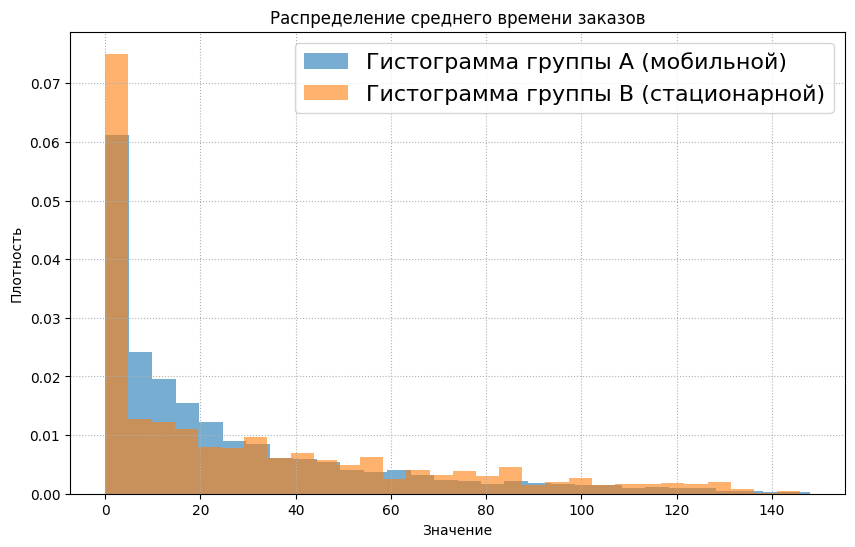

In [160]:
plt.figure(figsize=(10,6))
plt.hist(user_mobile['days_since_prev'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы А (мобильной)')
plt.hist(user_desktop['days_since_prev'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы В (стационарной)')
plt.title(
    'Распределение среднего времени заказов'
)
plt.xlabel('Значение')
plt.ylabel('Плотность')
plt.legend(fontsize=16)
plt.grid(ls=':')
plt.show()

Попробуем исключить выбросы и снова проверить распределение:

Выборочная дисперсия по пользователям мобильных устройств - 791.2, выборочная дисперсия по пользователям стационарных устройств - 1112.72


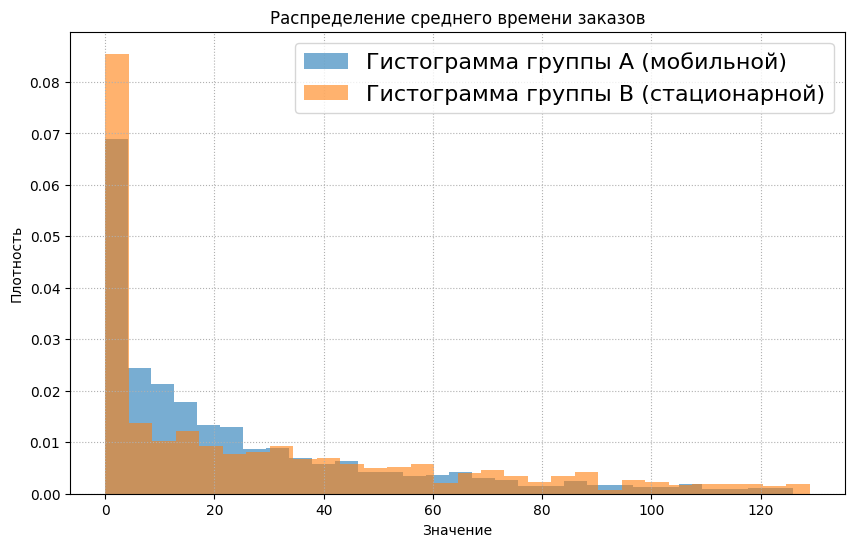

In [161]:
mobile_qn = user_mobile['days_since_prev'].quantile(0.99)
desktop_qn = user_desktop['days_since_prev'].quantile(0.99)

user_mobile = user_mobile[user_mobile.days_since_prev < mobile_qn]
user_desktop = user_desktop[user_desktop.days_since_prev < desktop_qn]

D_mobile = round(statistics.variance(user_mobile['days_since_prev']), 2)
D_desktop = round(statistics.variance(user_desktop['days_since_prev']), 2)

print(f'Выборочная дисперсия по пользователям мобильных устройств - {D_mobile}, выборочная дисперсия по пользователям стационарных устройств - {D_desktop}')

plt.figure(figsize=(10,6))
plt.hist(user_mobile['days_since_prev'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы А (мобильной)')
plt.hist(user_desktop['days_since_prev'], density=True, bins=30, alpha=0.6, 
         label='Гистограмма группы В (стационарной)')
plt.title(
    'Распределение среднего времени заказов'
)
plt.xlabel('Значение')
plt.ylabel('Плотность')
plt.legend(fontsize=16)
plt.grid(ls=':')
plt.show()

Выборочные дисперсии, даже после удаления выбросов, сильно отличаются, будем также использовать t-тест Уэлча:

In [162]:
metric_a = user_mobile['days_since_prev'] ## выборка целевой метрики для группы A
metric_b = user_desktop['days_since_prev'] ## выборка целевой метрики для группы B

alpha = 0.05
stat_ttest, p_value_welch_ttest = ttest_ind(
    metric_b,
    metric_a, 
    alternative='greater', # так как H1: a (мобильн) > b (стационарн) 
    equal_var=False,
)

if p_value_welch_ttest>alpha:
    print(f'p-value теста Уэлча = {round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза находит подтверждение!')
    print('Выборочные средние в группах A и B равны')
else:
    print(f'p-value теста Уэлча = {round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза не находит подтверждения!')
    print('Выборочные средние в группе A больше чем в группе B')

p-value теста Уэлча = 0.0
Нулевая гипотеза не находит подтверждения!
Выборочные средние в группе A больше чем в группе B


Нулевая гипотеза не нашла подтверждение, это значит, что по имеющимся данным средние время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

### Итоги статистического анализа:

Было проведено два A/B-тестирования c целью подтверждения следующих гипотез:
- Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств;
- Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

Для проведения первого теста были выбраны две не пересекающиеся группы пользователей и сумма их заказов за осень 2024 года. Далее, на основе этих данных был проведен t-тест Уэлча, который показал равенство среднего количества заказов на одного пользователя у обеих групп, т.е. среднее количество заказов на человека не зависит от типа устройства.

Для проведения второго теста также были выбраны две непересекающиеся группы пользователей с имеющимися данными по количеству дней с последней покупки. Далее, был проведен аналогичный t-тест Уэлча, который выявил статистически значимую разницу в среднем количестве дней между покупками в группах, т.е. по имеющимся данным средние время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

Для повышения частоты заказов со стационарных устройств, можно пересмотреть интерфейс сайта на ПК, возможно пользователи предпочитают пользоваться приложением именно из-за неудобности сайта.

## Общий вывод и рекомендации

В данном проекте был проведен исследовательский и статистический анализ данных о заказах билетов на сервисе Яндекс Афиша.

После проведенного исследовательского анализа распределения заказов по сегментам, можно отметить следующие сезонные изменения:
- С осени начинает резко расти количество заказов, это может быть связано с тем, что к осени люди возвращаются с отпусков и, из-за похолодания меньше гуляют и выбирают альтернативное времяпровождения покупая билеты на мероприятия, а также, причиной могут стать осенние скидки и акции на билеты;
- Вне зависимости от сезона, самыми популярными категориями мероприятий остаются: "Концерты", "Другое" и "Театр";
- Также, вне зависимости от сезона большая доля (80%) заказов сделаны с мобильных устройств, что не удивительно, так как мобильные устройства доступнее, приложения в них чаще удобнее, чем на ПК, а также, из-за того что мобильные устройства всегда под рукой, пользователи могут делать спонтанные заказы;
- И летом и осенью распределенеие заказов в зависимости от возрастного рейтинга остается примерно равным;
- Осенью существенно выросла доля покупок билетов в "Театр" и на "Ёлки", но существенно упала выручка с них, это также может объясняться акциями и скидками на билеты.

После проведенного исследовательского анализа осенней активности пользователей, можно отметить следующее:
- Общее количество заказов и количество заказов на одного человека в среднем выше в будние дни;
- Количество активных пользователей также растет в будни и падает на выходных, но прослеживается общая тенденция к росту количества пользователей;
- Количество заказов на одного человека 03-10-2024 и 01-10-2024 дни достигает более 6 заказов, так как в эти дни в принципе было сделано рекордное количество заказов;
- Динамика средней выручки за один билет напоминает перевернутый линейный график общего количества заказов, то есть, в дни когда было сделано наибольшее количество заказов - наименьшая выручка по дням (03-09-2024 и 31-10-2024). Это может объясняться акциями или скидками в эти дни, которые существенно снизили стоимость билетов и соответственно повлияли на количество заказов. Также, можно проследить, что выручка за один билет больше именно в выходные.

После проведенного исследовательского анализа популярных событий и партнёров, было выявлено:
- По доле проведения уникальных событий и доле заказов лидируют два региона: Каменевский регион и Североярская область, только они составляют почти половину от всех регионов в обеих категориях;
- Среди билетных партнеров также есть лидеры по количеству уникальных мероприятий и заказов: Лови билет, Билеты без проблем и Билеты в руки. 87% заказов на уникальные мероприятия и 70% всех заказов приходится на топ-5 билетных партнеров. Также, более 65% всей выручки приходится на топ-5 партнеров, лидеры из которых: Билеты без проблем, Мой билет и Облачко.

Также, было проведено два статистических A/B-тестирования c целью подтверждения следующих гипотез:
- Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств:
    - Тест показал равенство среднего количества заказов на одного пользователя у обеих групп, т.е. среднее количество заказов на человека не зависит от типа устройства.
- Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств:
    - Тест выявил статистически значимую разницу в среднем количестве дней между покупками в группах, т.е. по имеющимся данным средние время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

Для повышения частоты заказов со стационарных устройств, можно пересмотреть интерфейс сайта на ПК, возможно пользователи предпочитают пользоваться приложением именно из-за неудобности сайта.